# Train a policy using RL, part 2: multi-agent environment

In this notebook, we training multiple agents to perform the same task as in the `RL` notebook.

In [1]:
import gymnasium as gym
import numpy as np
from navground import sim
from navground_learning import ControlActionConfig, ObservationConfig
from navground_learning.reward import SocialReward

import warnings
warnings.filterwarnings('ignore')

sensor = sim.load_state_estimation("""
type: Discs
number: 5
range: 5.0
max_speed: 0.12
max_radius: 0.0
""")

scenario = sim.load_scenario("""
type: Cross
agent_margin: 0.1
side: 4
target_margin: 0.1
tolerance: 0.5
groups:
  -
    type: thymio
    number: 20
    radius: 0.1
    control_period: 0.1
    speed_tolerance: 0.02
    color: gray
    kinematics:
      type: 2WDiff
      wheel_axis: 0.094
      max_speed: 0.12
    behavior:
      type: HL
      optimal_speed: 0.12
      horizon: 5.0
      tau: 0.25
      eta: 0.5
      safety_margin: 0.1
    state_estimation:
      type: Bounded
      range: 5.0
""")

duration = 60.0
time_step = 0.1

action_config = ControlActionConfig(max_acceleration=1.0, max_angular_acceleration=10.0, 
                                    use_acceleration_action=True)

observation_config = ObservationConfig(include_target_distance=True, include_velocity=True, 
                                       include_angular_speed=True, flat=True)

We define an enviroment where all agents share the same configuration (and later the same policy)

In [42]:
from navground_learning.env.pz import shared_parallel_env
from navground_learning.env.pz_utils import make_venv
from stable_baselines3.common.vec_env import VecMonitor


env = shared_parallel_env(
    agent_indices=None,  # i.e., all agents
    scenario=scenario,
    sensor=sensor,
    action=action_config,
    observation=observation_config,
    reward=SocialReward(),
    time_step=time_step,
    render_mode="rgb_array",
    max_duration=duration,
    terminate_outside_bounds=False);

venv = VecMonitor(make_venv(env))

log_folder = 'logs/RL-MA'

and function to collect and plot the rewards for both types of agents and make a video from a run

In [3]:
from matplotlib import pyplot as plt
from navground.sim.ui.video import display_video_from_run
from navground_learning.evaluate import make_experiment_with_env
from navground_learning.config import get_elements_at, to_list

def display_run(policy=None, indices=None, seed=0, steps=600, color='red', **kwargs):
    if policy:
        policies=[(indices, policy)]
    else:
        policies = []
    experiment = make_experiment_with_env(env.unwrapped, policies=policies)
    experiment.number_of_runs = 1
    experiment.record_config.pose = True
    experiment.run_index = seed
    experiment.steps = steps
    experiment.run()
    for agent in get_elements_at(indices, experiment.runs[seed].world.agents):
        agent.color = color
    return display_video_from_run(experiment.runs[seed], **kwargs)

def plot_reward(policy=None, indices=None, number=1, steps=600, color='red'):
    if policy:
        policies=[(indices, policy)]
    else:
        policies = []
    experiment = make_experiment_with_env(env.unwrapped, policies=policies)
    experiment.number_of_runs = number
    experiment.steps = steps
    experiment.run()
    rewards = np.asarray([run.get_record("reward") for run in experiment.runs.values()])
    agents = experiment.runs[0].world.agents
    policy_indices = to_list(indices, agents) 
    original_indices = [i for i in range(len(agents)) if i not in policy_indices]
    if original_indices:
        rs = rewards[..., original_indices].flatten()
        plt.hist(rs, density=True, color='black', alpha=0.5, bins=30,
                 label=f"Agent with original behavior");
        print(f'Original behavior mean reward: {np.mean(rs):.3f} ± {np.std(rs):.3f}')
    if policy_indices:
        rs = rewards[..., policy_indices].flatten()
        plt.hist(rs, density=True, color=color, alpha=0.5, bins=30, 
                 label=f"Agents with policy")
        print(f'ML Policy mean reward: {np.mean(rs):.3f} ± {np.std(rs):.3f}')
    plt.title(f'Reward distribution')
    ax = plt.gca()
    ax.set_yticks([])
    ax.yaxis.set_tick_params(labelleft=False)
    plt.xlabel("reward")
    plt.ylabel("probability")
    plt.legend()

Let's start by loading the policy we have trained in the `RL` tutorial

In [5]:
from stable_baselines3 import SAC

sa_model = SAC.load('policies/RL/SAC.zip')

which has been trained to control a single agent among a group of agents controlled by `HL` instead, like this:

In [6]:
display_run(policy=sa_model.policy, indices=slice(0, 1), display_width=400, factor=10)

Original behavior mean reward: -0.266 ± 0.275
ML Policy mean reward: -0.276 ± 0.441


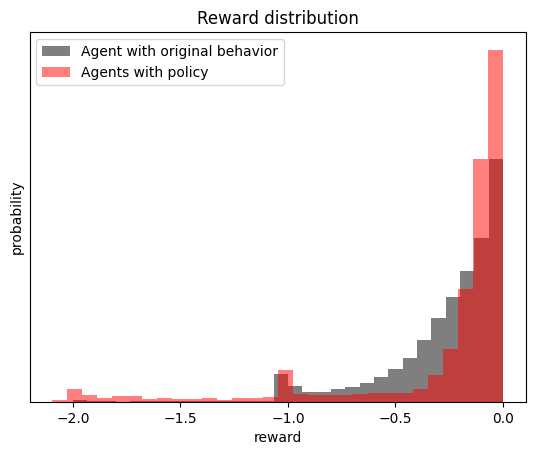

In [7]:
plot_reward(policy=sa_model.policy, indices=slice(0, 1), number=10, steps=600)

Let's try now to control *half* of the agents with the same policy:

In [8]:
display_run(policy=sa_model.policy, indices=slice(0, 10), display_width=400, factor=10)

Original behavior mean reward: -0.408 ± 0.442
ML Policy mean reward: -0.512 ± 0.573


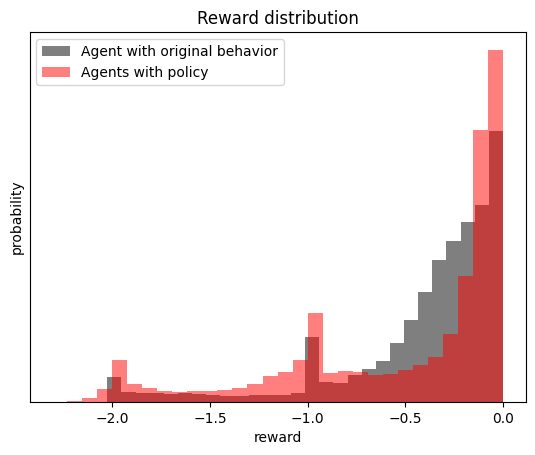

In [9]:
plot_reward(policy=sa_model.policy, indices=slice(0, 10), number=10, steps=600)

or even all agents but one:

In [10]:
display_run(policy=sa_model.policy, indices=slice(0, 19), display_width=400, factor=10)

Original behavior mean reward: -0.388 ± 0.433
ML Policy mean reward: -0.621 ± 0.602


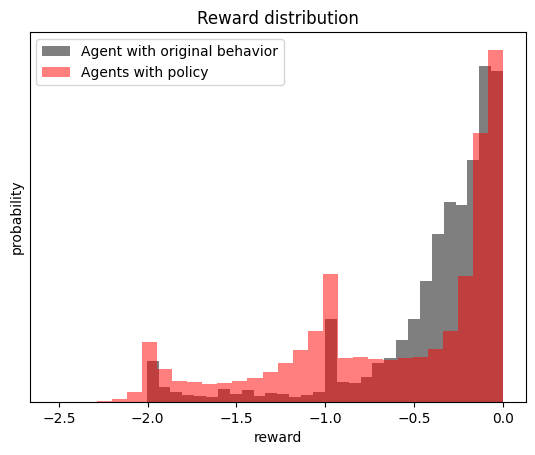

In [11]:
plot_reward(policy=sa_model.policy, indices=slice(0, 19), number=10, steps=600)

We note the descrease in performance, which is expected the task of moving among peers is 
significantly different than the task of moving among agents controlled by a deterministic behavior.

Let also have a look at the performance of a group composed solely of `HL` agents

Original behavior mean reward: -0.258 ± 0.256


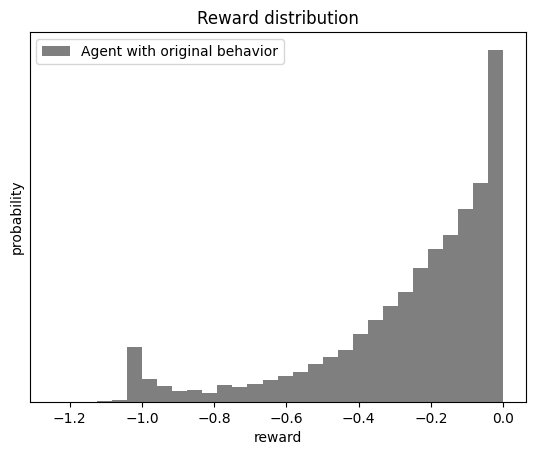

In [33]:
plot_reward(policy=None, indices=slice(0, 0), number=10, steps=600)

## Multi-agent RL learning

Let's try now to train a new policy that is shared among *all* agents during training.

In [12]:
from stable_baselines3 import SAC
from stable_baselines3.common.logger import configure

ma_model = SAC("MlpPolicy", venv, verbose=0)
ma_model.set_logger(configure(f'{log_folder}/SAC', ["csv", "tensorboard"]))

We train for the same number of runs as the single agent policy (and time, as training effectively parallelize over the agents):

In [13]:
import time

start = time.time()
ma_model.learn(total_timesteps=2_000_000, progress_bar=True, tb_log_name="SAC", log_interval=100)
print(f'Training took {time.time() - start: .0f} seconds')

Output()

Training took  809 seconds


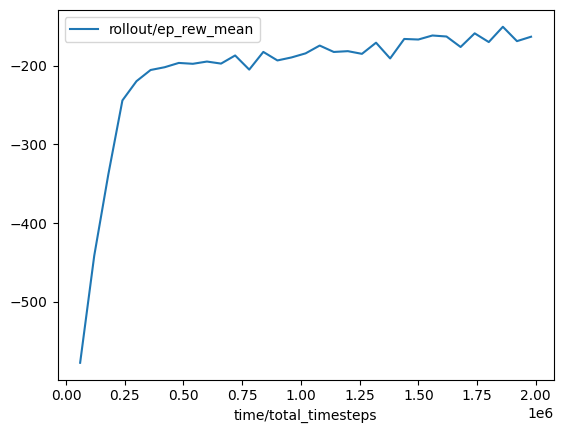

In [14]:
import pandas as pd

df = pd.read_csv(f'{log_folder}/SAC/progress.csv')
df.plot(y='rollout/ep_rew_mean', x='time/total_timesteps');

In [22]:
ma_model.save("policies/RL-MA/SAC")

Like before, let's test its performance with different numbers of HL agents.

**20 ML + 0 HL**

In [29]:
display_run(policy=ma_model.policy, indices=slice(0, 20), display_width=400, factor=10, steps=1800)

ML Policy mean reward: -0.315 ± 0.392


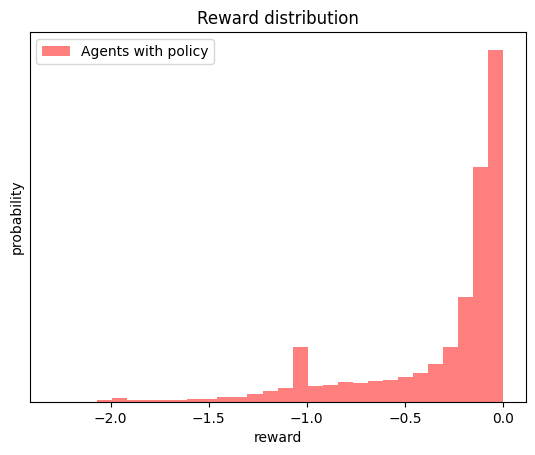

In [24]:
plot_reward(policy=ma_model.policy, indices=slice(0, 20), number=10, steps=600)

**19 ML + 1 HL**

In [38]:
display_run(policy=ma_model.policy, indices=slice(0, 19), display_width=400, factor=10, steps=1800)

Original behavior mean reward: -0.393 ± 0.449
ML Policy mean reward: -0.314 ± 0.387


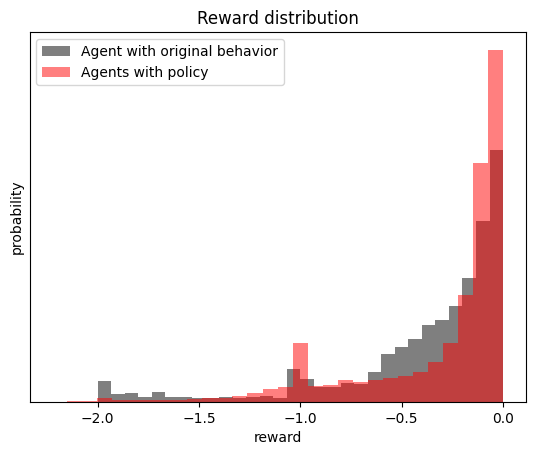

In [39]:
plot_reward(policy=ma_model.policy, indices=slice(0, 19), number=10, steps=600)

**10 ML + 10 HL**

In [31]:
display_run(policy=ma_model.policy, indices=slice(0, 10), display_width=400, factor=10, steps=1800)

Original behavior mean reward: -0.331 ± 0.334
ML Policy mean reward: -0.264 ± 0.355


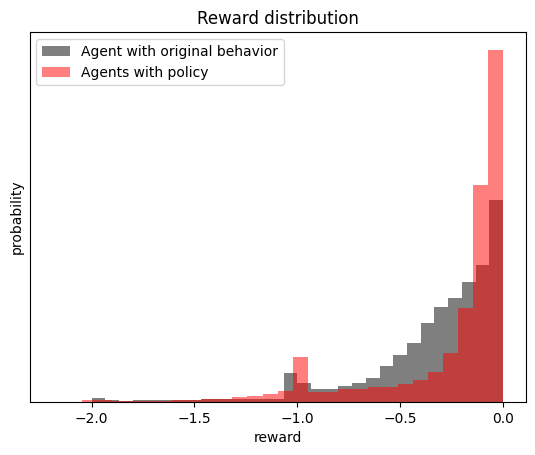

In [26]:
plot_reward(policy=ma_model.policy, indices=slice(0, 10), number=10, steps=600)

**1 ML + 19 HL**

In [30]:
display_run(policy=ma_model.policy, indices=slice(0, 1), display_width=400, factor=10, steps=1800)

Original behavior mean reward: -0.256 ± 0.259
ML Policy mean reward: -0.153 ± 0.243


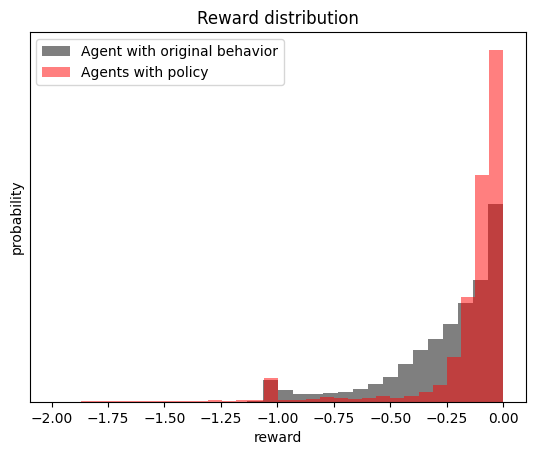

In [28]:
plot_reward(policy=ma_model.policy, indices=slice(0, 1), number=10, steps=600)

We observe that the performance of the [distributed] multi-agent ML policy is generally on-pair with `HL`. 
- One `HL` agent among many ML agents has a worse performance than among its peers.
- One ML agent among many `HL` agents has a better performance than among its peers. In general ML agents are more robust to the number of ML/HL neighbors. It even perform better than the single-agent policy we tested before!
- A whole group of ML agents performs slightly worse than a whole group of `HL` agents.